In [7]:
import pickle

# Define the path to your .pkl file
file_path = "/Users/ritwikghosh/Downloads/may_be_corrupt.pkl"

# Open the file in read mode
with open(file_path, "rb") as file:
    # Load the data from the file
    all_subject_data = pickle.load(file)

# Now you can use all_subject_data as your loaded data

In [8]:
all_subject_data

[{'subject': 'KM32_s12',
  'channel': 'Fz',
  'smell_id': 2.0,
  'features': array([[713,   1,   1],
         [713,   1,   1],
         [713,   2,   0],
         [713,   3,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   7,   0],
         [713,   8,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  11,   0],
         [713,  11,   0],
         [713,  11,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,   8,   0],
         [713,   8,   0],
         [713,   9,   0],
         [713,  10,   0],
         [713,   9,   0],
         [713, 

In [9]:
# Initialize lists to store the filtered features and labels
import numpy as np


filtered_features = []
filtered_labels = []

# Iterate over each subject's data and filter for 'Fz' channel
for data in all_subject_data:
    if data['channel'] == 'Pz' and data['subject']=='KM26_s02':
        # Extract features from the second column
        features = data['features'][:, 1]
        
        # Append features and labels to the filtered lists
        filtered_features.append(features)
        filtered_labels.append(data['smell_id'])

# Stack features vertically to create the feature matrix
filtered_features_matrix = np.vstack(filtered_features)

# Convert filtered_labels to a numpy array
filtered_labels_array = np.array(filtered_labels)

# Print the shape of the filtered features matrix and labels array
print("Filtered features matrix shape:", filtered_features_matrix.shape)
print("Filtered labels array shape:", filtered_labels_array.shape)

Filtered features matrix shape: (10, 300)
Filtered labels array shape: (10,)


In [10]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import ttest_ind

# Step 1: Apply PCA to reduce dimensionality
pca = PCA(n_components=3)
reduced_features = filtered_features_matrix

# Step 2: Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Step 3: Perform t-tests for each unique pair and print p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a]
    features_b = reduced_features[indices_b]
    features_a=features_a[0].tolist()
    features_b=features_b[0].tolist()
    # Perform t-test for each of the three PCA components
    
    t_stat_ind, p_val_ind = ttest_ind(features_a, features_b)
    
    # Print p-values for the pair
    print(f'P-values for smell pair ({smell_a}, {smell_b}): {p_val_ind}')


P-values for smell pair (2.0, 3.0): 8.376757860424517e-11
P-values for smell pair (2.0, 6.0): 1.6065522052780735e-06
P-values for smell pair (2.0, 7.0): 3.3714088539271126e-07
P-values for smell pair (2.0, 9.0): 2.2371186673042093e-23
P-values for smell pair (2.0, 10.0): 2.6655333918296474e-05
P-values for smell pair (2.0, 16.0): 6.973830808845212e-07
P-values for smell pair (2.0, 17.0): 2.221900419007329e-18
P-values for smell pair (2.0, 21.0): 4.727646893294929e-47
P-values for smell pair (2.0, 22.0): 8.27871873789678e-09
P-values for smell pair (3.0, 6.0): 0.027170644218486327
P-values for smell pair (3.0, 7.0): 4.602301141899178e-22
P-values for smell pair (3.0, 9.0): 0.00015152007732670774
P-values for smell pair (3.0, 10.0): 0.032018837324578095
P-values for smell pair (3.0, 16.0): 0.05259405647379809
P-values for smell pair (3.0, 17.0): 0.2375873209625277
P-values for smell pair (3.0, 21.0): 1.7861769759889192e-09
P-values for smell pair (3.0, 22.0): 0.0694826519242764
P-values 

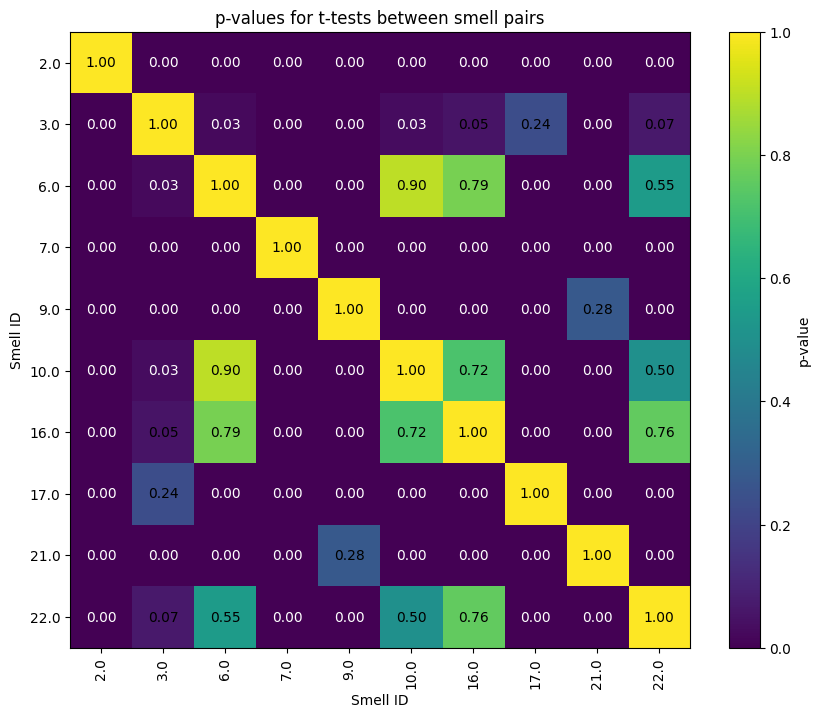

In [11]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt



# Step 1: Apply PCA to reduce dimensionality
pca = PCA(n_components=3)
reduced_features = filtered_features_matrix

# Step 2: Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a 10x10 matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Step 3: Perform t-tests for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform t-test for the PCA components
    t_stat_ind, p_val_ind = ttest_ind(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Step 4: Plot the 10x10 matrix
plt.figure(figsize=(10, 8))
plt.imshow(p_values_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), smell_ids, rotation=90)
plt.yticks(range(n_smells), smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                 ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.title('p-values for t-tests between smell pairs')
plt.show()


In [12]:
filtered_features_matrix.shape

(10, 300)

In [13]:
import numpy as np
from scipy.stats import shapiro

# Assuming filtered_features_matrix is your numpy matrix
# Example initialization (replace this with your actual data)
# filtered_features_matrix = np.random.rand(10, 300)

# Iterate over each row and perform the Shapiro-Wilk test
p_values = []
for i in range(filtered_features_matrix.shape[0]):
    _, p_value = shapiro(filtered_features_matrix[i, :])
    p_values.append(p_value)
    print(f"Row {i+1} p-value: {p_value}")

# Optionally, if you want to store and print all p-values at once
print("All p-values:")
print(p_values)


Row 1 p-value: 6.2668187813454045e-12
Row 2 p-value: 2.9686847185071813e-23
Row 3 p-value: 4.102653782640208e-16
Row 4 p-value: 6.029753860660544e-14
Row 5 p-value: 2.852962390569964e-28
Row 6 p-value: 8.387416396410581e-19
Row 7 p-value: 8.823294630399252e-20
Row 8 p-value: 1.3167794980832257e-19
Row 9 p-value: 7.947053663710207e-22
Row 10 p-value: 1.8250318535812187e-15
All p-values:
[6.2668187813454045e-12, 2.9686847185071813e-23, 4.102653782640208e-16, 6.029753860660544e-14, 2.852962390569964e-28, 8.387416396410581e-19, 8.823294630399252e-20, 1.3167794980832257e-19, 7.947053663710207e-22, 1.8250318535812187e-15]


In [14]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import kruskal

# Step 1: Apply PCA to reduce dimensionality
reduced_features = filtered_features_matrix

# Step 2: Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Step 3: Perform Kruskal-Wallis test for each unique pair and print p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a]
    features_b = reduced_features[indices_b]
    
    # Convert the first PCA component of each feature set to lists
    features_a = features_a[0].tolist()
    features_b = features_b[0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA component
    h_stat, p_val = kruskal(features_a, features_b)
    
    # Print p-values for the pair
    print(f'P-values for smell pair ({smell_a}, {smell_b}): {p_val}')


P-values for smell pair (2.0, 3.0): 8.19542339601375e-24
P-values for smell pair (2.0, 6.0): 2.446430589679161e-09
P-values for smell pair (2.0, 7.0): 0.0006449493845272203
P-values for smell pair (2.0, 9.0): 6.256157485696107e-54
P-values for smell pair (2.0, 10.0): 7.564192197350107e-11
P-values for smell pair (2.0, 16.0): 7.339912568346726e-10
P-values for smell pair (2.0, 17.0): 6.2474474922852146e-24
P-values for smell pair (2.0, 21.0): 1.0569164153956299e-49
P-values for smell pair (2.0, 22.0): 2.786183502986116e-08
P-values for smell pair (3.0, 6.0): 1.2807334997275247e-09
P-values for smell pair (3.0, 7.0): 4.152753641257664e-28
P-values for smell pair (3.0, 9.0): 1.6401840695219968e-34
P-values for smell pair (3.0, 10.0): 0.00011516131053496745
P-values for smell pair (3.0, 16.0): 4.736206818351498e-11
P-values for smell pair (3.0, 17.0): 0.48212433551640255
P-values for smell pair (3.0, 21.0): 3.0797479556095164e-13
P-values for smell pair (3.0, 22.0): 2.7193080795136057e-13


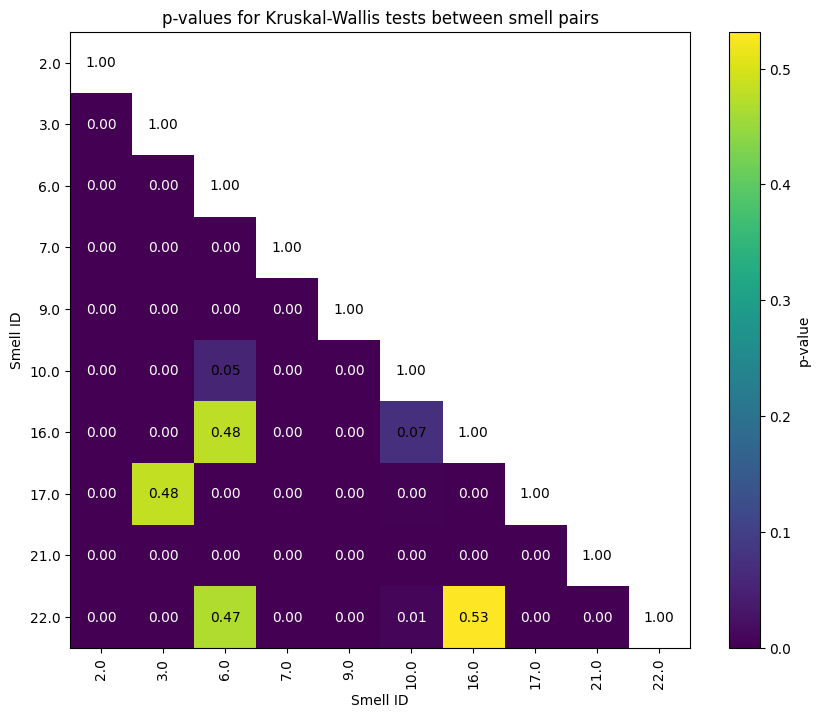

In [15]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import kruskal
import matplotlib.pyplot as plt

# Assuming filtered_features_matrix and filtered_labels_array are already defined
# reduced_features = PCA(n_components=3).fit_transform(filtered_features_matrix)
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Mask the upper triangular part of the matrix
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool))

# Plot the lower triangular part of the matrix
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), smell_ids, rotation=90)
plt.yticks(range(n_smells), smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i >= j:  # Only annotate the lower triangular part
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.title('p-values for Kruskal-Wallis tests between smell pairs')
plt.show()


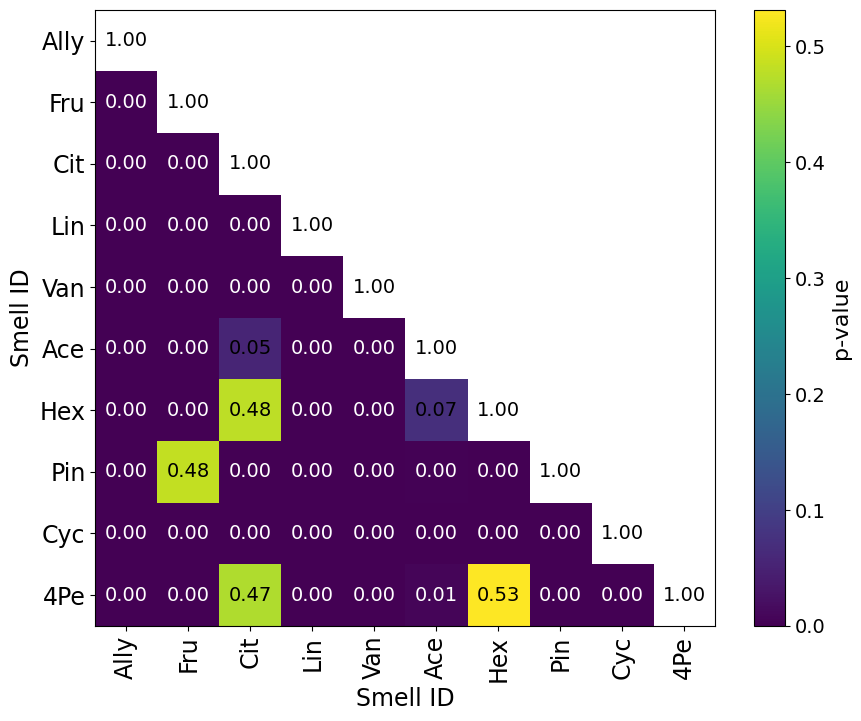

In [30]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import kruskal
import matplotlib.pyplot as plt
import os

# Assuming filtered_features_matrix and filtered_labels_array are already defined
# reduced_features = PCA(n_components=3).fit_transform(filtered_features_matrix)
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in smell_ids]

# Mask the upper triangular part of the matrix
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool))

# Plot the lower triangular part of the matrix
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
cbar = plt.colorbar(label='p-value')
cbar.ax.tick_params(labelsize=14)  # Increase color bar tick size
cbar.set_label('p-value', fontsize=16)  # Increase font size of color bar label
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90, fontsize=14)  # Increase font size of x-tick labels
plt.yticks(range(n_smells), encoded_smell_ids, fontsize=14)  # Increase font size of y-tick labels

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i >= j:  # Only annotate the lower triangular part
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black', fontsize=14)  # Increase font size of annotations

plt.xlabel('Smell ID', fontsize=17)
plt.ylabel('Smell ID', fontsize=17)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)


plt.title('', fontsize=16)

# Save the plot to a PDF file
directory = '/Users/ritwikghosh/Downloads/PDF images of Research Paper'
save_loc = os.path.join(directory, 'Kruskal Test.pdf')
plt.savefig(save_loc, format='pdf')

# Display the plot
plt.show()


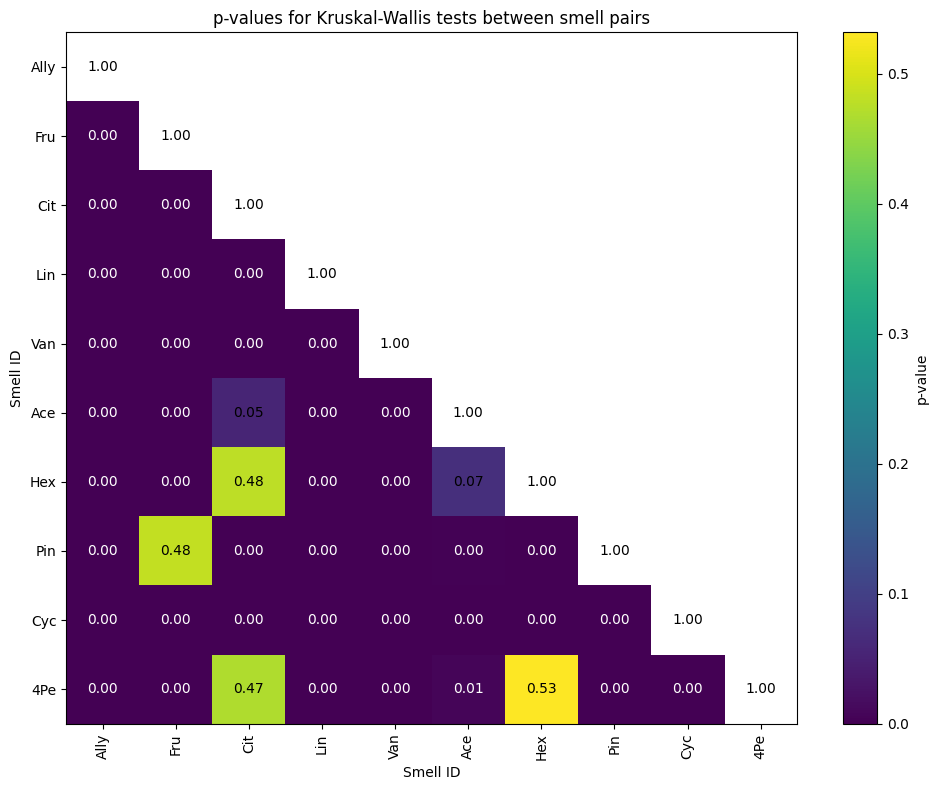

In [6]:
import numpy as np
from scipy.stats import kruskal
import matplotlib.pyplot as plt

# Simulated data for the purpose of this example
#filtered_features_matrix = np.random.rand(50, 10)
#filtered_labels_array = np.random.choice([2, 3, 6, 7, 9, 10, 16, 17, 21, 22], 50)

# Assuming the matrix is already PCA-reduced as stated in the prompt
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in smell_ids]

# Mask the upper triangular part of the matrix
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool))

# Plot the lower triangular part of the matrix
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90)
plt.yticks(range(n_smells), encoded_smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i >= j:  # Only annotate the lower triangular part
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.title('p-values for Kruskal-Wallis tests between smell pairs')
plt.tight_layout()
plt.savefig('/Users/ritwikghosh/Downloads/Features Df/kruskal_wallis_p_values.pdf', bbox_inches='tight')
plt.show()


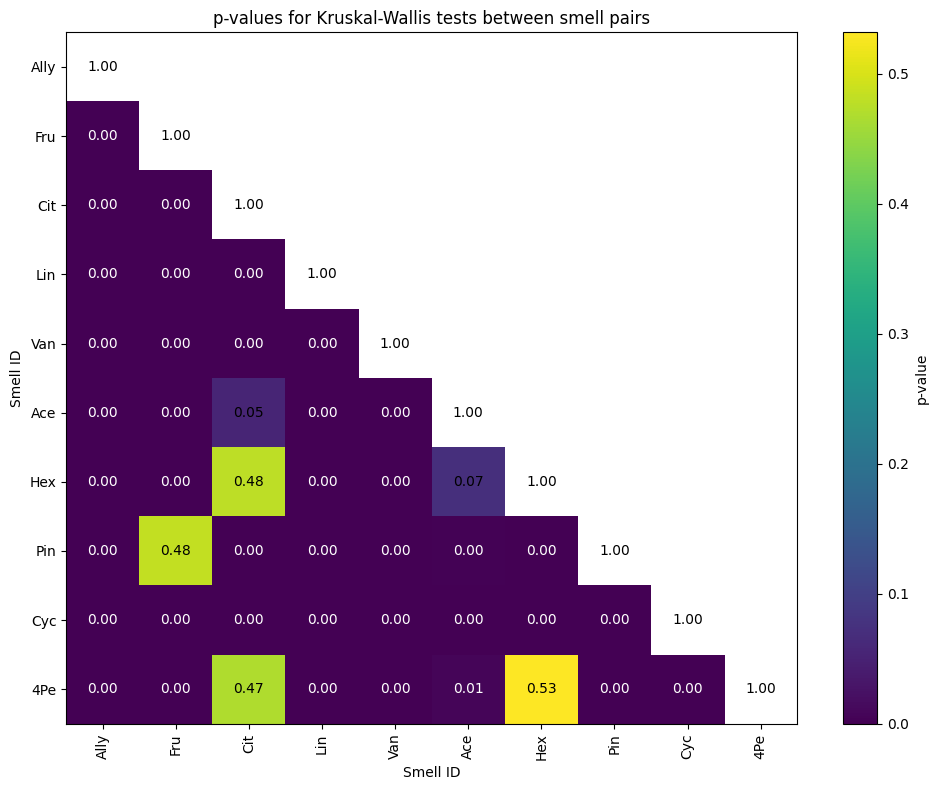

In [9]:
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90)
plt.yticks(range(n_smells), encoded_smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i >= j:  # Only annotate the lower triangular part
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.title('p-values for Kruskal-Wallis tests between smell pairs')
plt.tight_layout()
plt.savefig('/Users/ritwikghosh/Downloads/Features Df/kruskal_wallis_p_values_no_margin_with_labels.pdf', bbox_inches='tight', pad_inches=0)
plt.show()

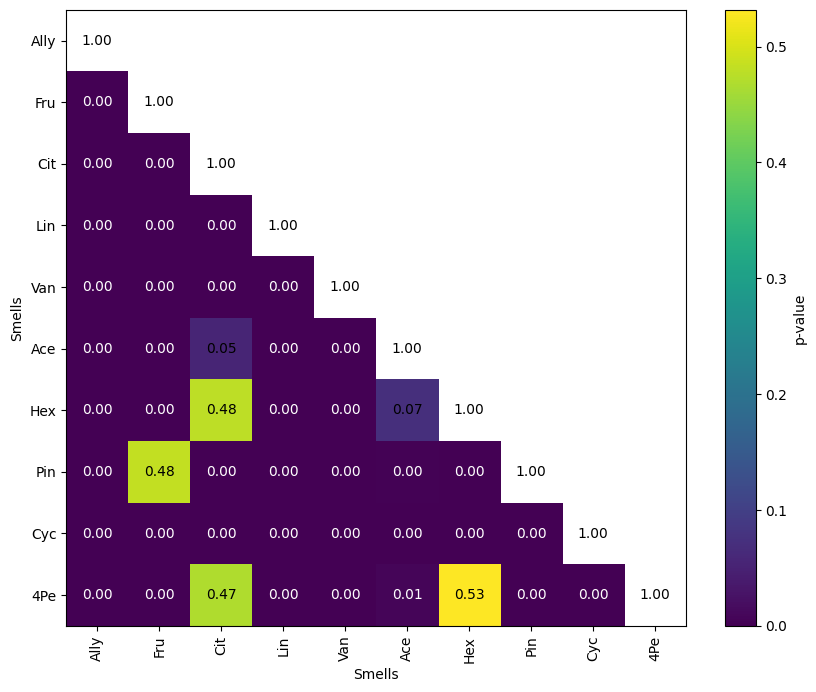

In [12]:
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90)
plt.yticks(range(n_smells), encoded_smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i >= j:  # Only annotate the lower triangular part
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smells')
plt.ylabel('Smells')
plt.title('')
plt.savefig('/Users/ritwikghosh/Downloads/Features Df/kruskal_wallis_p_values_no_margin_with_labels.pdf', bbox_inches='tight', pad_inches=0)
plt.show()

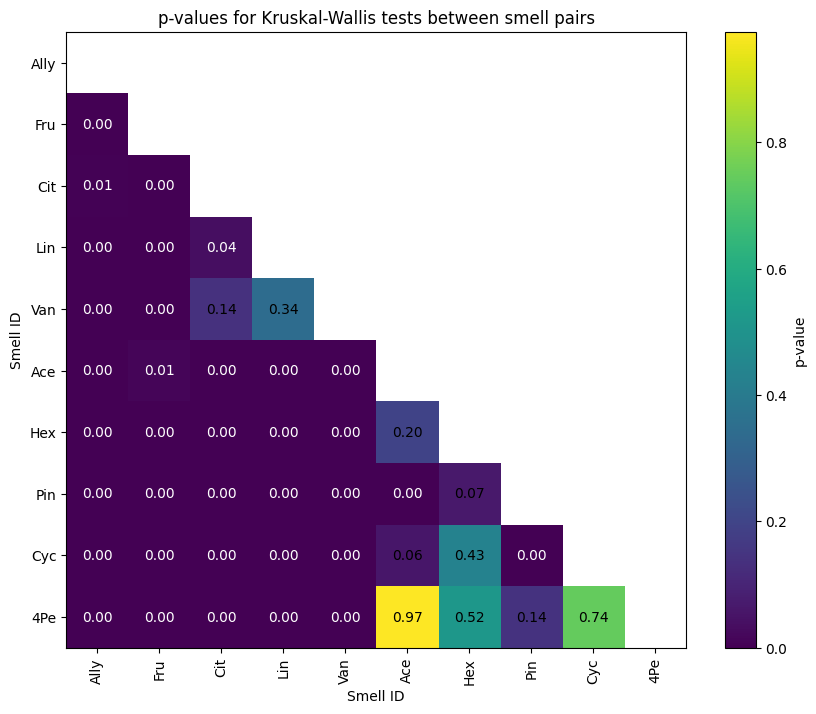

In [6]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import kruskal
import matplotlib.pyplot as plt

# Assuming filtered_features_matrix and filtered_labels_array are already defined
# reduced_features = PCA(n_components=3).fit_transform(filtered_features_matrix)
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in smell_ids]

# Mask the upper triangular part of the matrix, including the diagonal
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool), k=0)

# Plot the lower triangular part of the matrix
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part and the diagonal
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90)
plt.yticks(range(n_smells), encoded_smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i > j:  # Only annotate the lower triangular part excluding the diagonal
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.title('p-values for Kruskal-Wallis tests between smell pairs')
plt.show()


In [117]:
features_matrix

NameError: name 'features_matrix' is not defined

In [87]:
pca=PCA(n_components=3)
new_matrix= pca.fit_transform(filtered_features_matrix)

In [129]:
filtered_features_matrix.shape

(10, 300)

In [115]:
filtered_features_matrix.shape

(10, 300)

In [89]:
new_matrix.shape

(10, 3)

In [90]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

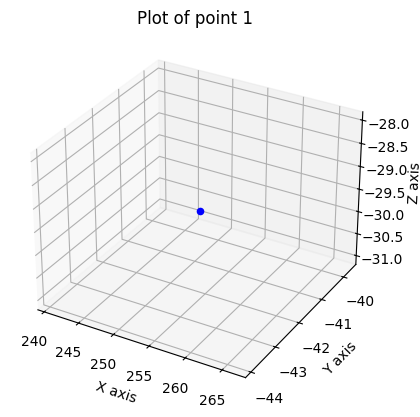

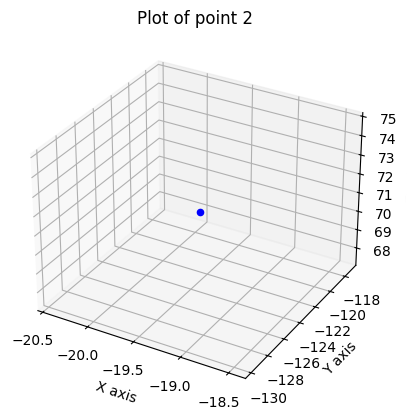

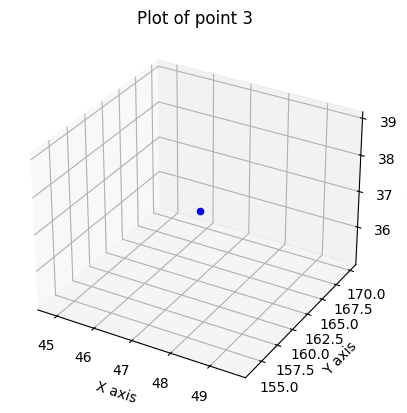

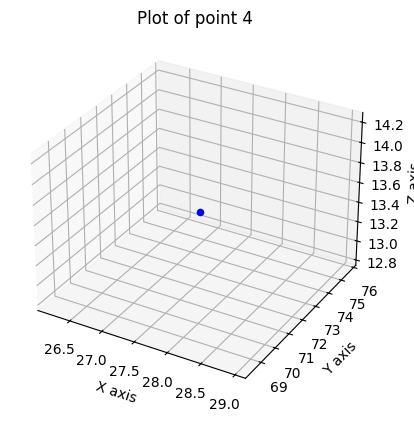

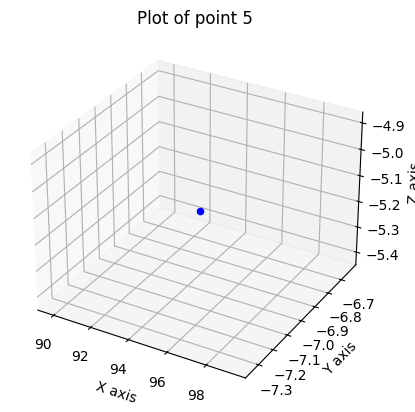

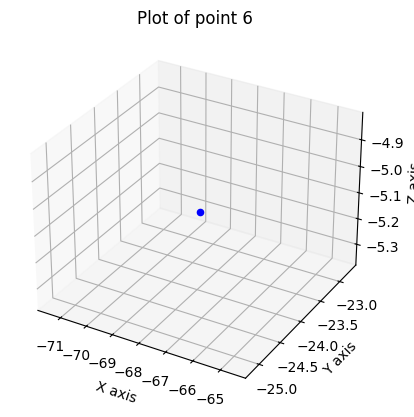

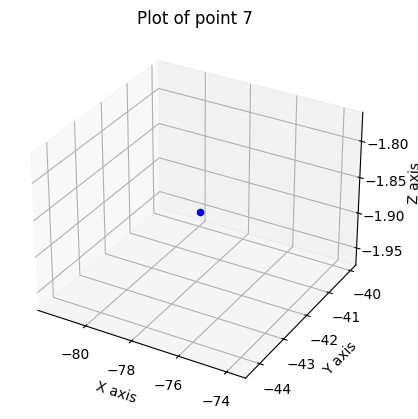

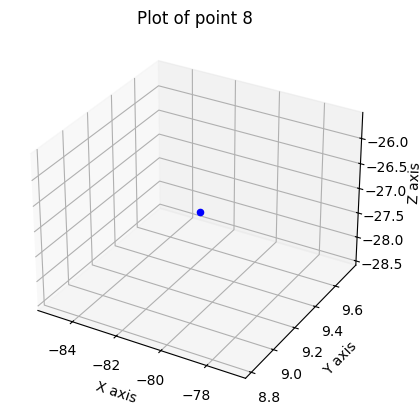

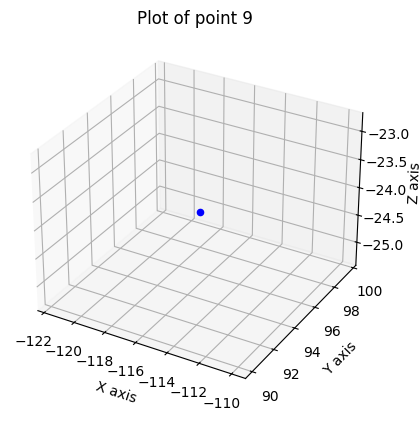

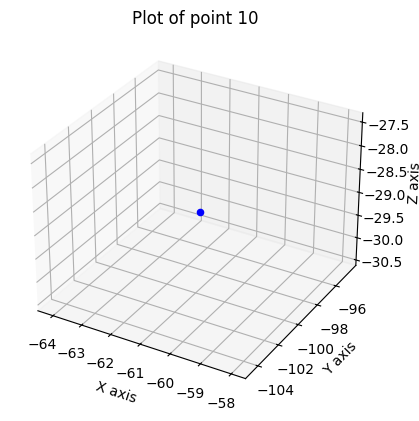

In [91]:
for i in range(new_matrix.shape[0]):
    x = new_matrix[i, 0]
    y = new_matrix[i, 1]
    z = new_matrix[i, 2]

    # Create a new figure for each plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, c='b', marker='o')

    # Set labels for axes
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')

    # Set the title to indicate which point is being plotted
    ax.set_title(f'Plot of point {i+1}')

    # Show the plot
    plt.show()


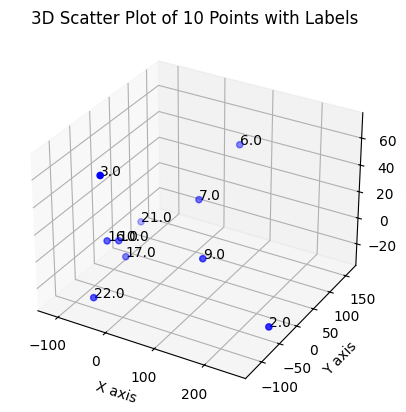

In [95]:
x = new_matrix[:, 0]
y = new_matrix[:, 1]
z = new_matrix[:, 2]

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='b', marker='o')

# Annotate each point with its corresponding label
for i in range(len(x)):
    ax.text(x[i], y[i], z[i], '%s' % (str(filtered_labels_array[i])), size=10, zorder=1, color='k')

# Set labels for axes
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')

# Set the title for the plot
ax.set_title('3D Scatter Plot of 10 Points with Labels')

# Show the plot
plt.show()

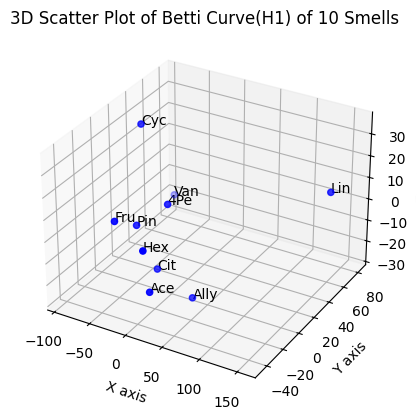

In [109]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming new_matrix and filtered_labels_array are already defined
x = new_matrix[:, 0]
y = new_matrix[:, 1]
z = new_matrix[:, 2]

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_labels = [d[id] for id in filtered_labels_array]

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='b', marker='o')

# Annotate each point with its corresponding label
for i in range(len(x)):
    ax.text(x[i], y[i], z[i], '%s' % (encoded_labels[i]), size=10, zorder=1, color='k')

# Set labels for axes
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')

# Set the title for the plot
ax.set_title('3D Scatter Plot of Betti Curve(H1) of 10 Smells')

# Show the plot
plt.show()


In [114]:
new_matrix

array([[ 37.20716443,  -7.07304997, -26.98994939],
       [-35.79959975, -34.5099074 ,  10.44061971],
       [ -4.73427688, -12.55032637, -15.86609234],
       [155.48509084,  56.10913395,  12.54939146],
       [-91.54348482,  81.80194616, -20.3329408 ],
       [ 20.86523109, -42.88020299, -13.22679387],
       [ 14.99125694, -44.77542327,   5.64526971],
       [-29.5751885 , -15.11663996,   2.81469646],
       [-61.97545038,  18.49196031,  35.29692576],
       [ -4.92074297,   0.50250955,   9.66887329]])

In [113]:
new_matrix[:,1]

array([ -7.07304997, -34.5099074 , -12.55032637,  56.10913395,
        81.80194616, -42.88020299, -44.77542327, -15.11663996,
        18.49196031,   0.50250955])

In [98]:
# Initialize lists to store the filtered features and labels
import numpy as np


filtered_features = []
filtered_labels = []

# Iterate over each subject's data and filter for 'Fz' channel
for data in all_subject_data:
    if data['channel'] == 'Pz' and data['subject']=='KM26_s02':
        # Extract features from the second column
        features = data['features'][:, 1]
        
        # Append features and labels to the filtered lists
        filtered_features.append(features)
        filtered_labels.append(data['smell_id'])

# Stack features vertically to create the feature matrix
filtered_features_matrix = np.vstack(filtered_features)

# Convert filtered_labels to a numpy array
filtered_labels_array = np.array(filtered_labels)

# Print the shape of the filtered features matrix and labels array
print("Filtered features matrix shape:", filtered_features_matrix.shape)
print("Filtered labels array shape:", filtered_labels_array.shape)

Filtered features matrix shape: (10, 300)
Filtered labels array shape: (10,)


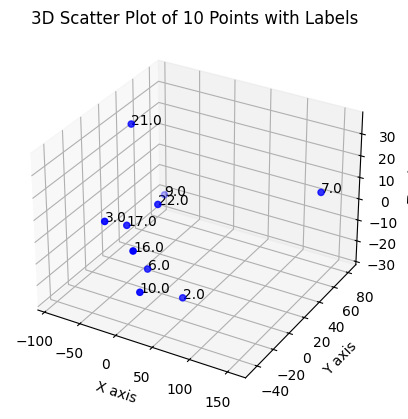

In [99]:
pca=PCA(n_components=3)
new_matrix= pca.fit_transform(filtered_features_matrix)

x = new_matrix[:, 0]
y = new_matrix[:, 1]
z = new_matrix[:, 2]

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='b', marker='o')

# Annotate each point with its corresponding label
for i in range(len(x)):
    ax.text(x[i], y[i], z[i], '%s' % (str(filtered_labels_array[i])), size=10, zorder=1, color='k')

# Set labels for axes
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')

# Set the title for the plot
ax.set_title('3D Scatter Plot of 10 Points with Labels')

# Show the plot
plt.show()

In [100]:
new_matrix

array([[ 37.20716443,  -7.07304997, -26.98994939],
       [-35.79959975, -34.5099074 ,  10.44061971],
       [ -4.73427688, -12.55032637, -15.86609234],
       [155.48509084,  56.10913395,  12.54939146],
       [-91.54348482,  81.80194616, -20.3329408 ],
       [ 20.86523109, -42.88020299, -13.22679387],
       [ 14.99125694, -44.77542327,   5.64526971],
       [-29.5751885 , -15.11663996,   2.81469646],
       [-61.97545038,  18.49196031,  35.29692576],
       [ -4.92074297,   0.50250955,   9.66887329]])

In [15]:
filtered_data = [entry for entry in all_subject_data if entry['channel'] == 'Pz']


In [16]:
filtered_data[0].keys()

dict_keys(['subject', 'channel', 'smell_id', 'features'])

In [2]:
import os
data_directory = '/Users/ritwikghosh/Downloads/ProcData/EEG/Signals'

# Initialize a list to store dictionaries for each subject
subject = []

# Iterate over each subject directory
for subject_folder in os.listdir(data_directory):
    subject.append(subject_folder)

In [3]:
subject

['KM32_s12',
 'KM32_s15',
 'KM32_s14',
 'KM32_s13',
 '.DS_Store',
 'KM32_s09',
 'KM26_s09',
 'KM32_s07',
 'KM26_s06',
 'KM32_s01',
 'KM26_s01',
 'KM32_s08',
 'KM26_s08',
 'KM32_s16',
 'KM32_s11',
 'KM32_s10',
 'KM32_s17',
 'KM26_s04',
 'KM26_s03',
 'KM32_s02',
 'KM26_s02',
 'KM26_s05',
 'KM32_s05']

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

# Dictionary for smell ID to label conversion
smell_dict = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Subject names
subject_names = ['KM26_s02']

# Assume `filtered_data` is already defined and populated
# filtered_data is a list of dictionaries with keys ['channel','subject','features','smell_id']

for subject in subject_names:
    filtered_features = []
    filtered_labels = []
    
    for data in filtered_data:
        if data['subject'] == subject:
            # Extract features from the second column
            features = data['features'][:, 1]
            
            # Append features and labels to the filtered lists
            filtered_features.append(features)
            filtered_labels.append(data['smell_id'])
    
    # Convert to numpy array for processing
    filtered_features_array = np.vstack(filtered_features)
    filtered_labels_array = np.array(filtered_labels)
    
    # Perform PCA to reduce the features to 3 dimensions
    pca = PCA(n_components=3)
    new_matrix = pca.fit_transform(filtered_features_array)
    
    # Plotting
    x = new_matrix[:, 0]
    y = new_matrix[:, 1]
    z = new_matrix[:, 2]
    
    # Encode smell IDs using the dictionary
    encoded_labels = [smell_dict[id] for id in filtered_labels_array]
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(x, y, z, c='b', marker='o')
    
    # Annotate each point with its corresponding label
    for i in range(len(x)):
        ax.text(x[i], y[i], z[i], '%s' % (encoded_labels[i]), size=10, zorder=1, color='k')
    
    # Set labels for axes
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    
    # Set the title for the plot
    ax.set_title(f'3D Scatter Plot of Betti Curve(H1) of 10 Smells for Subject {subject}')
    
    # Show the plot
    plt.show()


NameError: name 'filtered_data' is not defined

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from matplotlib.backends.backend_pdf import PdfPages

# Dictionary for smell ID to label conversion
smell_dict = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Assign colors to each smell
colors = {'Ally': 'r', 'Fru': 'g', 'Cit': 'b', 'Lin': 'c', 'Van': 'm', 'Ace': 'y', 'Hex': 'k', 'Pin': 'orange', 'Cyc': 'purple', '4Pe': 'brown'}

# Subject names
subject_names = ['KM26_s02']

# Assume `filtered_data` is already defined and populated
# filtered_data is a list of dictionaries with keys ['channel','subject','features','smell_id']

for subject in subject_names:
    filtered_features = []
    filtered_labels = []
    
    for data in filtered_data:
        if data['subject'] == subject:
            # Extract features from the second column
            features = data['features'][:, 1]
            
            # Append features and labels to the filtered lists
            filtered_features.append(features)
            filtered_labels.append(data['smell_id'])
    
    # Convert to numpy array for processing
    filtered_features_array = np.vstack(filtered_features)
    filtered_labels_array = np.array(filtered_labels)
    
    # Perform PCA to reduce the features to 3 dimensions
    pca = PCA(n_components=3)
    new_matrix = pca.fit_transform(filtered_features_array)
    
    # Plotting
    x = new_matrix[:, 0]
    y = new_matrix[:, 1]
    z = new_matrix[:, 2]
    
    # Encode smell IDs using the dictionary
    encoded_labels = [smell_dict[id] for id in filtered_labels_array]
    
    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    for i in range(len(x)):
        ax.scatter(x[i], y[i], z[i], c=colors[encoded_labels[i]], marker='o', label=encoded_labels[i])
    
    # Annotate each point with its corresponding label
    for i in range(len(x)):
        ax.text(x[i], y[i], z[i], '%s' % (encoded_labels[i]), size=10, zorder=1, color='k')
    
    # Set labels for axes
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    
    # Set the title for the plot
    ax.set_title('')
    
    # Handle the legend
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1.15, 0.5), fontsize='small', title='Smells')
    
    # Save the plot as a PDF
    pdf_path = '/Users/ritwikghosh/Downloads/Features Df/3D_Scatter_Plot_Subject_' + subject + '.pdf'
    with PdfPages(pdf_path) as pdf:
        pdf.savefig(fig, bbox_inches='tight')
    
    # Show the plot
    plt.show()


NameError: name 'filtered_data' is not defined

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

# Dictionary for smell ID to label conversion
smell_dict = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Assume `filtered_data` is already defined and populated
# filtered_data is a list of dictionaries with keys ['channel','subject','features','smell_id']

# Initialize a dictionary to store features by smell_id
smell_features = {smell_id: [] for smell_id in smell_dict.keys()}

# Loop through each subject and accumulate features by smell_id
for data in filtered_data:
    smell_id = data['smell_id']
    features = data['features'][:, 1]  # Extract the second column of features
    smell_features[smell_id].append(features)

# Compute the average features for each smell_id
averaged_features = {smell_id: np.mean(features, axis=0) for smell_id, features in smell_features.items()}

# Convert to numpy arrays for processing
averaged_features_array = np.vstack(list(averaged_features.values()))
smell_ids = np.array(list(averaged_features.keys()))

# Perform PCA to reduce the features to 3 dimensions
pca = PCA(n_components=3)
new_matrix = pca.fit_transform(averaged_features_array)

# Plotting
x = new_matrix[:, 0]
y = new_matrix[:, 1]
z = new_matrix[:, 2]

# Encode smell IDs using the dictionary
encoded_labels = [smell_dict[id] for id in smell_ids]

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='b', marker='o')

# Annotate each point with its corresponding label
for i in range(len(x)):
    ax.text(x[i], y[i], z[i], '%s' % (encoded_labels[i]), size=10, zorder=1, color='k')

# Set labels for axes
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')

# Set the title for the plot
ax.set_title('3D Scatter Plot of Betti Curve(H1) Averaged for 10 Smells')

# Show the plot
plt.show()


NameError: name 'filtered_data' is not defined

In [1]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import kruskal
import matplotlib.pyplot as plt

# Assuming filtered_features_matrix and filtered_labels_array are already defined
# reduced_features = PCA(n_components=3).fit_transform(filtered_features_matrix)
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in smell_ids]

# Mask the upper triangular part of the matrix, including the diagonal
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool), k=0)

# Plot the lower triangular part of the matrix
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part and the diagonal
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90)
plt.yticks(range(n_smells), encoded_smell_ids)

# Annotate the matrix with p-values, formatted to two decimal places
for i in range(n_smells):
    for j in range(n_smells):
        if i > j:  # Only annotate the lower triangular part excluding the diagonal
            plt.text(j, i, f'{p_values_matrix[i, j]:.2f}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.savefig('p_values_matrix.pdf')
plt.show()


NameError: name 'filtered_features_matrix' is not defined

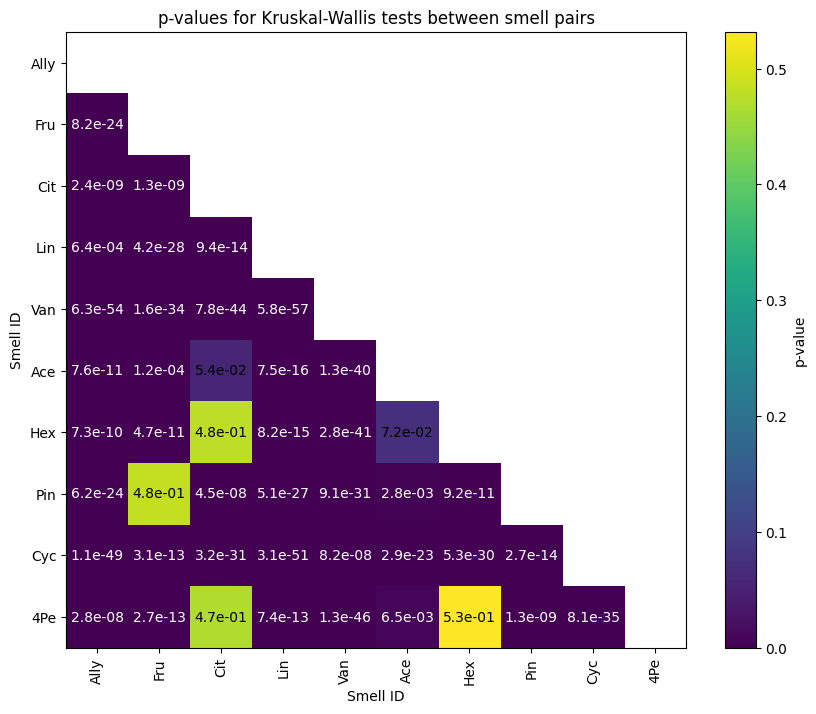

In [10]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.stats import kruskal
import matplotlib.pyplot as plt

# Assuming filtered_features_matrix and filtered_labels_array are already defined
# reduced_features = PCA(n_components=3).fit_transform(filtered_features_matrix)
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in smell_ids]

# Mask the upper triangular part of the matrix, including the diagonal
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool), k=0)

# Plot the lower triangular part of the matrix
plt.figure(figsize=(10, 8))
# Use a masked array to hide the upper triangular part and the diagonal
masked_matrix = np.ma.array(p_values_matrix, mask=mask)
plt.imshow(masked_matrix, cmap='viridis', interpolation='none', aspect='auto')
plt.colorbar(label='p-value')
plt.xticks(range(n_smells), encoded_smell_ids, rotation=90)
plt.yticks(range(n_smells), encoded_smell_ids)

# Annotate the matrix with p-values in scientific notation
for i in range(n_smells):
    for j in range(n_smells):
        if i > j:  # Only annotate the lower triangular part excluding the diagonal
            plt.text(j, i, f'{p_values_matrix[i, j]:.1e}',
                     ha='center', va='center', color='white' if p_values_matrix[i, j] < 0.05 else 'black')

plt.xlabel('Smell ID')
plt.ylabel('Smell ID')
plt.title('p-values for Kruskal-Wallis tests between smell pairs')
plt.show()


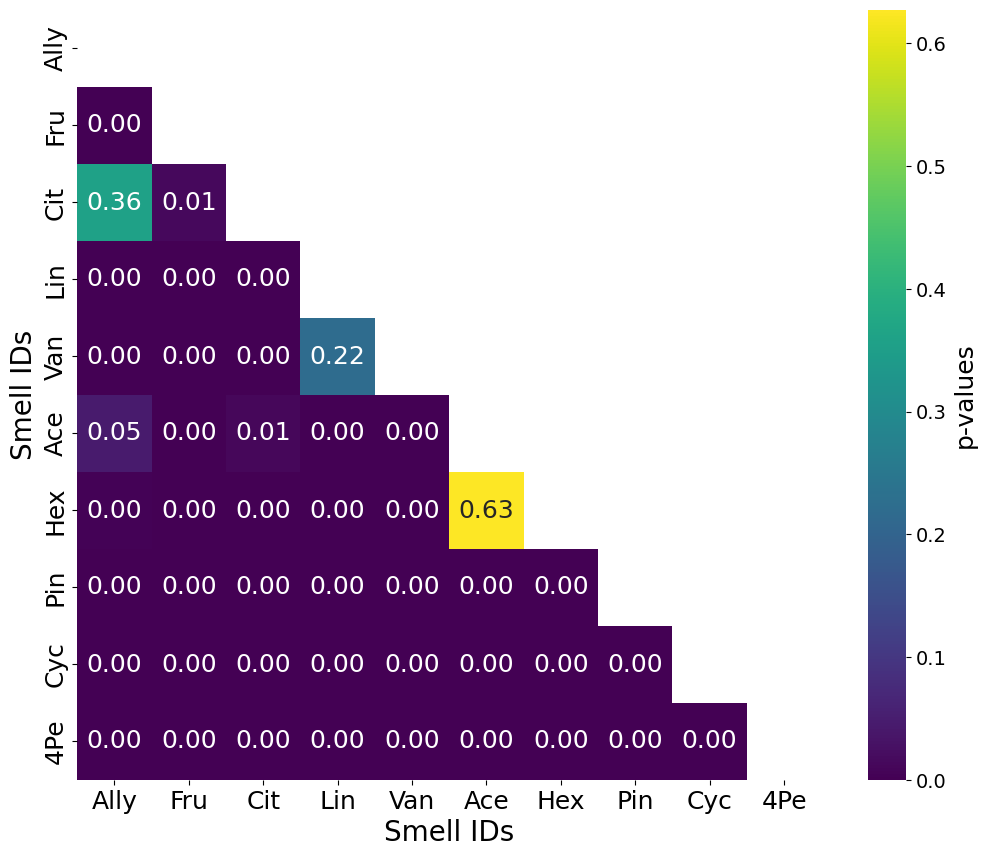

In [50]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ks_2samp
from itertools import combinations
import os

# Load the dataset
file_path = '/Users/ritwikghosh/Downloads/Features Df/features_df.csv'
data = pd.read_csv(file_path)

# Get column names
columns = data.columns

# Initialize an empty array to store p-values
num_columns = len(columns)
p_values_matrix = np.full((num_columns, num_columns), np.nan)

# Perform KS test for each pair of columns
for i, j in combinations(range(num_columns), 2):
    col1 = columns[i]
    col2 = columns[j]
    stat, p_value = ks_2samp(data[col1], data[col2])
    p_values_matrix[i, j] = p_value
    p_values_matrix[j, i] = p_value

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool))

# Plot the lower triangular part of the p-values matrix
plt.figure(figsize=(12, 10))
ax = sns.heatmap(p_values_matrix, cmap='viridis', mask=mask, annot=True, fmt=".2f", cbar=True,
                 xticklabels=columns, yticklabels=columns, annot_kws={"size": 18})

# Add a label to the color bar and increase the size of the numbers on the color bar
cbar = ax.collections[0].colorbar
cbar.set_label('p-values', fontsize=18)
cbar.ax.tick_params(labelsize=14)  # Increase the font size of the color bar ticks

plt.title('', fontsize=16)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Smell IDs', fontsize=20)
plt.ylabel('Smell IDs', fontsize=20)
# Save the plot to a PDF file
directory = '/Users/ritwikghosh/Downloads/PDF images of Research Paper'
save_loc = os.path.join(directory, 'KSTest_Pvalues.pdf')
plt.savefig(save_loc, format='pdf')

# Display the plot
plt.show()


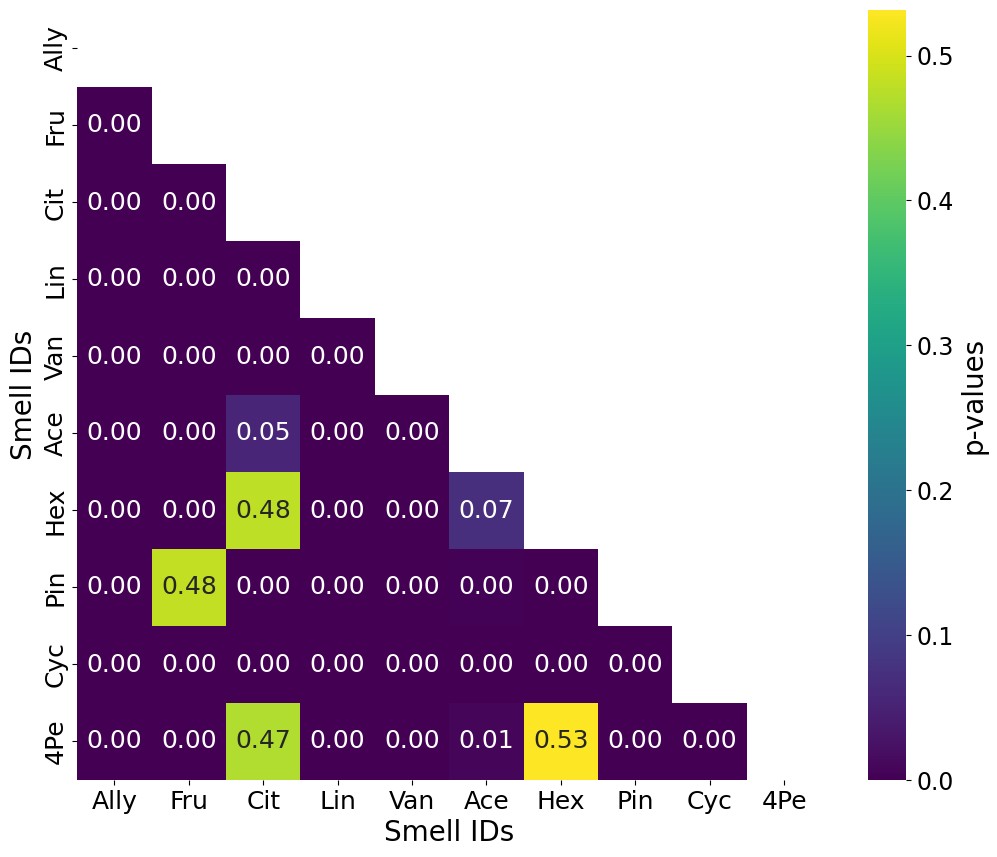

In [52]:
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns

# Assuming filtered_features_matrix and filtered_labels_array are already defined
# reduced_features = PCA(n_components=3).fit_transform(filtered_features_matrix)
reduced_features = filtered_features_matrix  # Use the provided matrix directly

# Generate unique pairs of smell IDs manually
smell_ids = np.unique(filtered_labels_array)
n_smells = len(smell_ids)
pairs = [(smell_ids[i], smell_ids[j]) for i in range(n_smells) for j in range(i + 1, n_smells)]

# Initialize a matrix to store p-values
p_values_matrix = np.ones((n_smells, n_smells))

# Perform Kruskal-Wallis test for each unique pair and fill the matrix with p-values
for smell_a, smell_b in pairs:
    # Get indices of features corresponding to smell IDs smell_a and smell_b
    indices_a = np.where(filtered_labels_array == smell_a)[0]
    indices_b = np.where(filtered_labels_array == smell_b)[0]
    
    # Extract features corresponding to the indices
    features_a = reduced_features[indices_a][0].tolist()
    features_b = reduced_features[indices_b][0].tolist()
    
    # Perform Kruskal-Wallis test for the PCA components
    _, p_val_ind = kruskal(features_a, features_b)
    
    # Fill the matrix with p-values
    idx_a = np.where(smell_ids == smell_a)[0][0]
    idx_b = np.where(smell_ids == smell_b)[0][0]
    p_values_matrix[idx_a, idx_b] = p_val_ind
    p_values_matrix[idx_b, idx_a] = p_val_ind  # Mirror the value for symmetry

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in smell_ids]

# Mask the upper triangular part of the matrix
mask = np.triu(np.ones_like(p_values_matrix, dtype=bool))

# Plot the lower triangular part of the matrix
plt.figure(figsize=(12, 10))
ax = sns.heatmap(p_values_matrix, cmap='viridis', mask=mask, annot=True, fmt=".2f", cbar=True,
                 xticklabels=encoded_smell_ids, yticklabels=encoded_smell_ids, annot_kws={"size": 18})

# Add a label to the color bar and increase the size of the numbers on the color bar
cbar = ax.collections[0].colorbar
cbar.set_label('p-values', fontsize=20)
cbar.ax.tick_params(labelsize=17)  # Increase the font size of the color bar ticks
plt.xlabel('Smell IDs', fontsize=20)
plt.ylabel('Smell IDs', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Save the plot to a PDF file
directory = '/Users/ritwikghosh/Downloads/PDF images of Research Paper'
save_loc = os.path.join(directory, 'Kruskal Test.pdf')
plt.savefig(save_loc, format='pdf')

# Display the plot
plt.show()
